age                int64
workclass         object
fnlwgt             int64
education         object
education_num      int64
marital-status    object
occupation        object
relationship      object
race              object
sex               object
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
income            object
dtype: object
0     <=50K
1     <=50K
2     <=50K
3     <=50K
4     <=50K
Name: income, dtype: object
(32561, 15)
   age          workclass  fnlwgt   education  education_num       marital-status          occupation    relationship    race      sex  capital-gain  capital-loss  hours-per-week  native-country  income
0   39          State-gov   77516   Bachelors             13        Never-married        Adm-clerical   Not-in-family   White     Male          2174             0              40   United-States       0
1   50   Self-emp-not-inc   83311   Bachelors             13   Married-civ-spouse     Exec-managerial    

C:\Users\SrikarUmmineni\AppData\Local\Temp\ipykernel_8332\2741626585.py:74: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




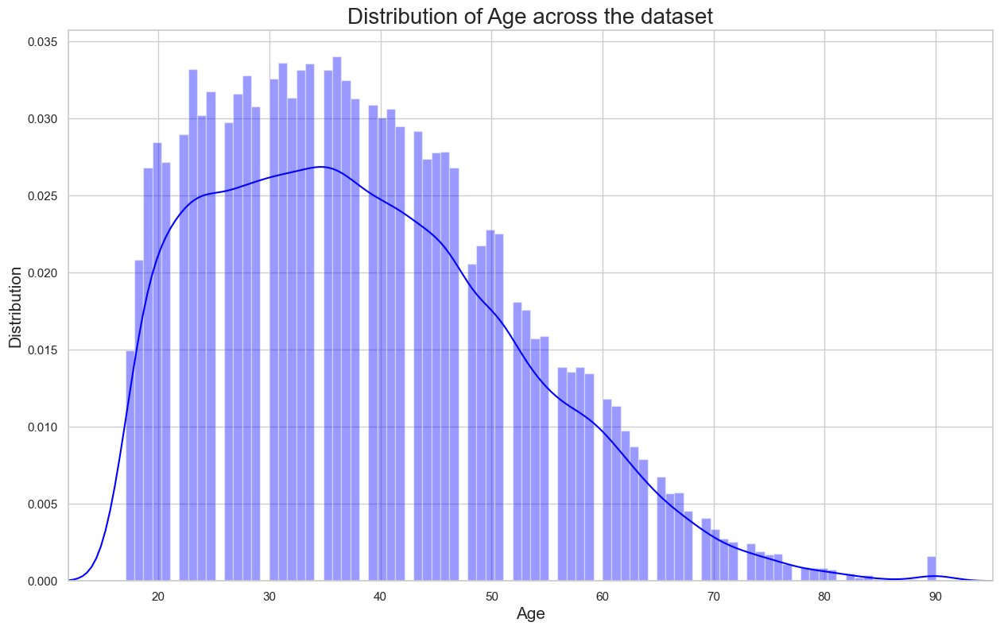

The maximum age is 90
The minimum age is 17


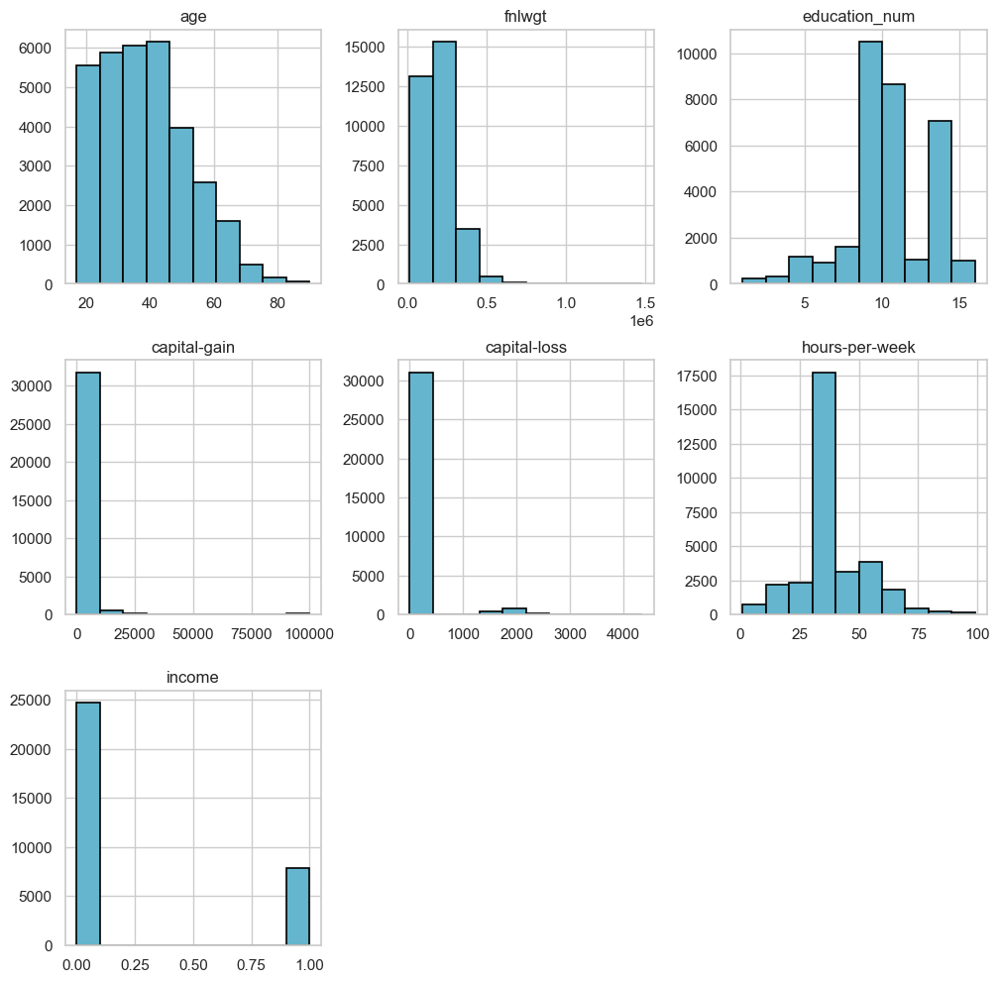

C:\Users\SrikarUmmineni\AppData\Local\Temp\ipykernel_8332\2741626585.py:90: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



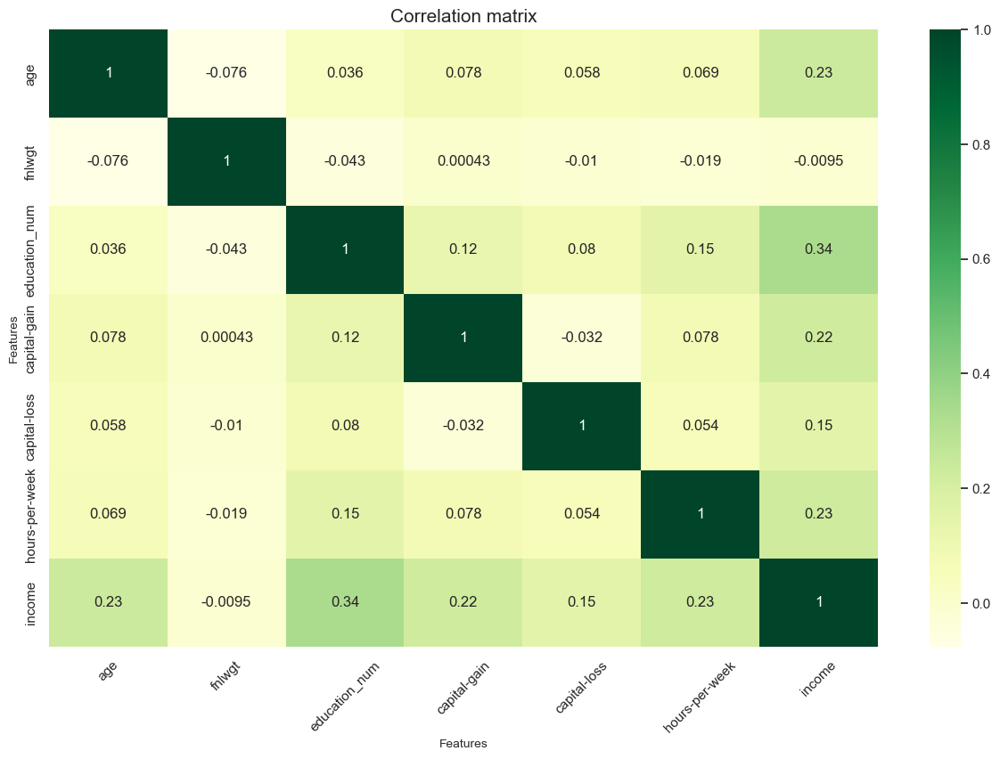

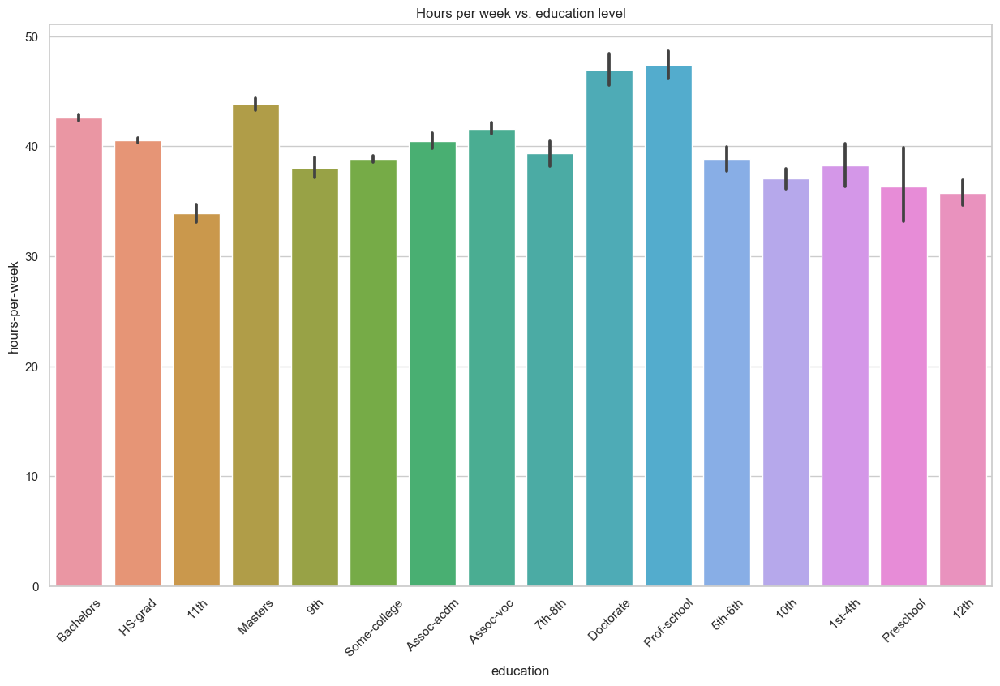

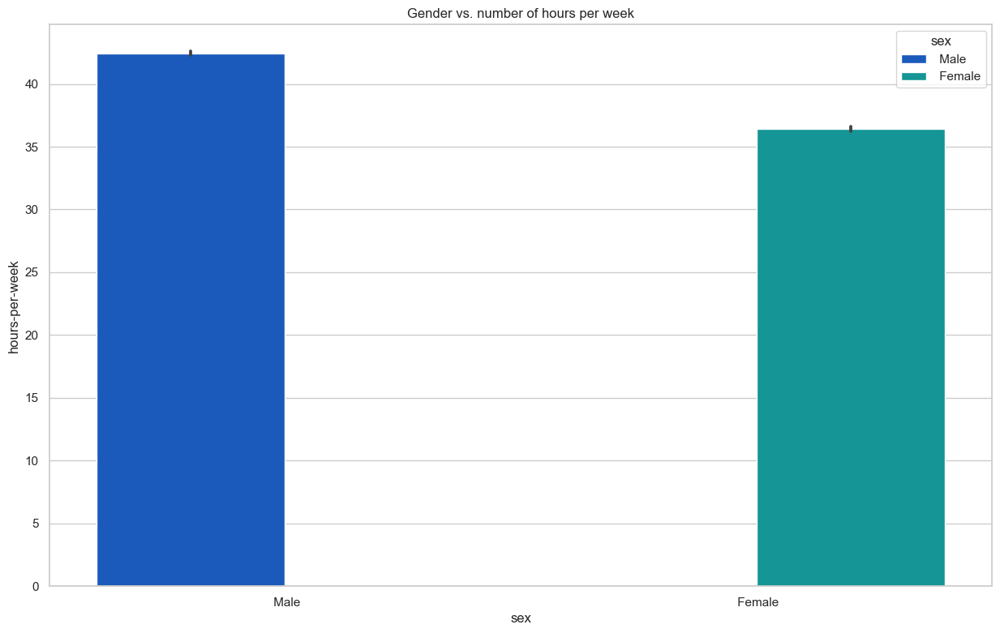

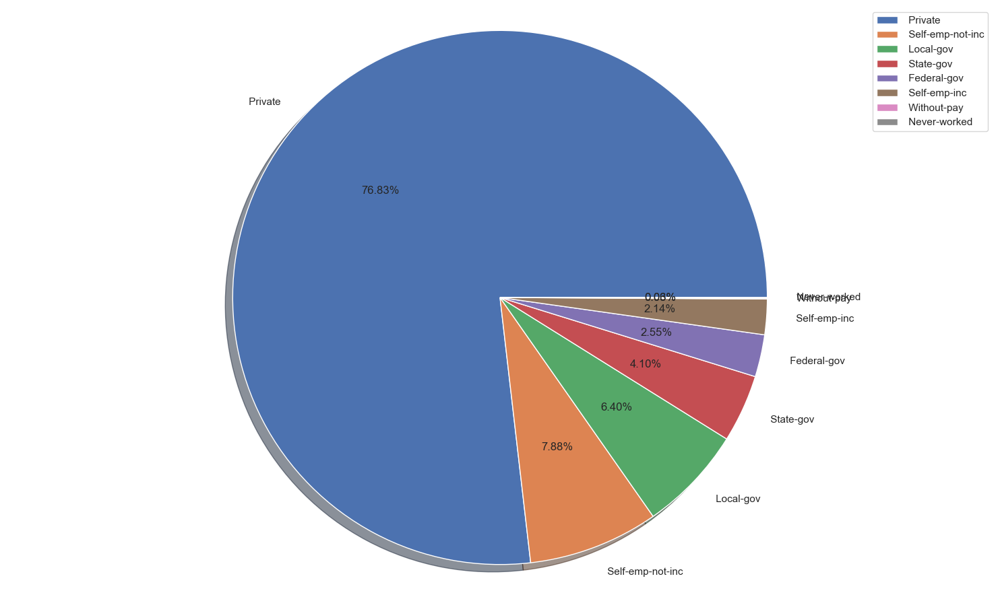

[' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' Doctorate' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']


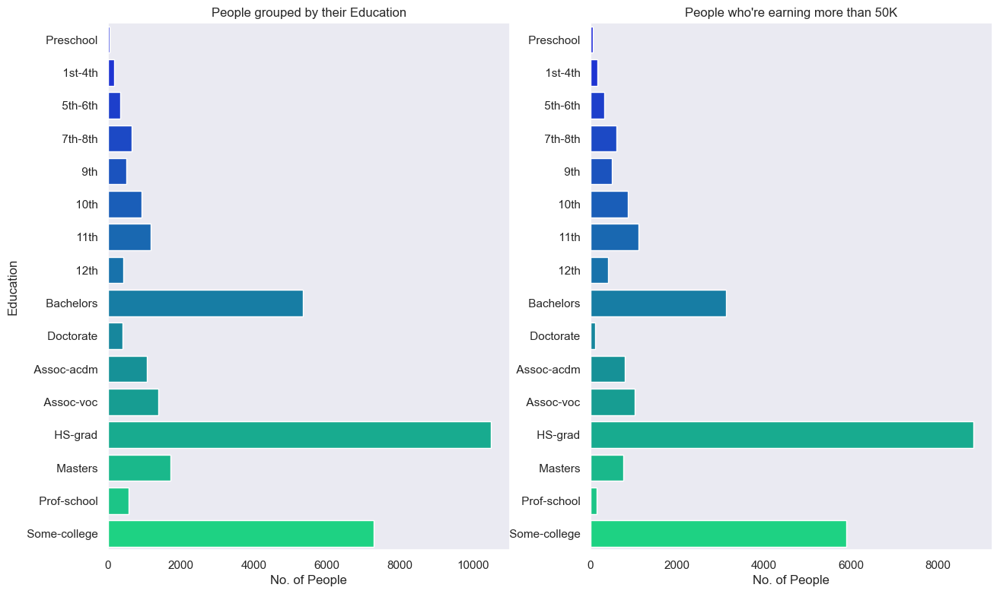

[' Cambodia', ' Canada', ' China', ' Columbia', ' Cuba', ' Dominican-Republic', ' Ecuador', ' El-Salvador', ' England', ' France', ' Germany', ' Greece', ' Guatemala', ' Haiti', ' Holand-Netherlands', ' Honduras', ' Hong', ' Hungary', ' India', ' Iran', ' Ireland', ' Italy', ' Jamaica', ' Japan', ' Laos', ' Mexico', ' Nicaragua', ' Outlying-US(Guam-USVI-etc)', ' Peru', ' Philippines', ' Poland', ' Portugal', ' Puerto-Rico', ' Scotland', ' South', ' Taiwan', ' Thailand', ' Trinadad&Tobago', ' United-States', ' Vietnam', ' Yugoslavia']
41
[' Cambodia', ' Canada', ' China', ' Columbia', ' Cuba', ' Dominican-Republic', ' Ecuador', ' El-Salvador', ' England', ' France', ' Germany', ' Greece', ' Guatemala', ' Haiti', ' Honduras', ' Hong', ' Hungary', ' India', ' Iran', ' Ireland', ' Italy', ' Jamaica', ' Japan', ' Laos', ' Mexico', ' Nicaragua', ' Peru', ' Philippines', ' Poland', ' Portugal', ' Puerto-Rico', ' Scotland', ' South', ' Taiwan', ' Thailand', ' Trinadad&Tobago', ' United-States'

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

pd.set_option('display.float_format', lambda x: f'{x:.3f}')

# df=pd.read_csv(r"C:\Users\SrikarUmmineni\PycharmProjects\pythonProject\Urban_Computing\census+income\adult.data")
columns=['age','workclass','fnlwgt','education','education_num','marital-status','occupation','relationship','race',
         'sex','capital-gain','capital-loss','hours-per-week','native-country','income']

df=pd.read_csv(r"C:\Users\SrikarUmmineni\PycharmProjects\pythonProject\Urban_Computing\census+income\adult.data",header=None)
df_test = pd.read_csv(r"C:\Users\SrikarUmmineni\PycharmProjects\pythonProject\Urban_Computing\census+income\adult.test",header=None)
df.columns=columns
df_test.columns=columns
print(df.dtypes)

print(df['income'].head())
income_map = {' <=50K': 0, ' >50K': 1, ' <=50K.':0,' >50K.':1}

df['income'] = df['income'].map(income_map)
df_test['income'] = df_test['income'].map(income_map)
print(df.shape)
print(df.head().to_string())
print(df.describe().to_string())
print(df.info())

print("Missing values in train set")
for i in df.columns:
    print(f"{i} : {df[i].isna().sum()}")
    
print("Missing values in train set")
for i in df.columns:
    print(f"{i} : {df[i].isna().sum()}")


    
df=df.drop_duplicates(keep='first')
print("After dropping duplicates, the shape of the dataset is :", df.shape)

for i in df.columns:
    t = df[i].value_counts()
    index = list(t.index)
    print ("The Value Counts of ? in", i)
    for i in index:
        temp = 0
        if i == ' ?':
            print (t[' ?'])
            temp = 1
            break
    if temp == 0:
        print ("0")

print("The missing values in test set")
for i in df_test.columns:
    t = df_test[i].value_counts()
    index = list(t.index)
    print ("The Value Counts of ? in", i)
    for i in index:
        temp = 0
        if i == ' ?':
            print(t[' ?'])
            temp = 1
            break
    if temp == 0:
        print ("0")

df=df.applymap(lambda x: np.nan if x==' ?' else x)
df_test=df_test.applymap(lambda x: np.nan if x==' ?' else x)
        
# This distribution plot shows the distribution of Age of people across the Data Set
# plt.rcParams['figure.figsize'] = [12, 8]
sns.set(style = 'whitegrid')
sns.distplot(df['age'], bins = 90, color = 'blue')
plt.title("Distribution of Age across the dataset",fontsize=20)
plt.ylabel("Distribution", fontsize = 15)
plt.xlabel("Age", fontsize = 15)
plt.margins(x = 0)
plt.show()
print ("The maximum age is", df['age'].max())
print ("The minimum age is", df['age'].min())

# Distribution of Different Features of the Dataset
distribution = df.hist(edgecolor = 'black', linewidth = 1.2, color = 'c')
fig = plt.gcf()
fig.set_size_inches(12,12)
plt.show()

# Correlation matrix plot between all the numerical features
sns_grad=sns.heatmap(df.corr(), annot = True, color = 'blue', cmap = 'YlGn')
plt.setp(sns_grad.get_xticklabels(), rotation=45)
plt.title("Correlation matrix",fontsize=15)
plt.xlabel("Features",fontsize=10)
plt.ylabel("Features",fontsize=10)
plt.show()

# This shows the hours per week according to the education of the person
sns_grad = sns.barplot(x = df['education'], y = df['hours-per-week'], data = df)
plt.setp(sns_grad.get_xticklabels(), rotation=45)
plt.title("Hours per week vs. education level")
plt.show()

# This bar graph shows the difference of hours per week between male and female
sns.set(style = 'whitegrid')
sns.barplot(x = df['sex'], y = df['hours-per-week'], data = df,
            estimator = np.mean, hue = 'sex', palette = 'winter')
plt.title("Gender vs. number of hours per week")
plt.show()

# Creating Pandas Series for the workclasses whose income is higher than 50K
df_ = df.loc[df['income'] == 0,['workclass']]
workclass_types = df_['workclass'].value_counts()
labels = list(workclass_types.index)
aggregate = list(workclass_types)

# This Pie chat shows the Percentage of different workclass who earns more than 50K
plt.pie(aggregate, labels = labels, autopct='%1.2f%%', shadow=True)
plt.legend(labels, loc = 'best')
plt.axis('equal')
plt.tight_layout()
plt.show()

# Grouping people by their education
education_size = df.groupby('education').size()

# Grouping people who earns more than 50K by their education
more_income = df.loc[df['income'] == 0, ['education']].groupby('education').size()

sns.set(style = 'dark')
plt.rcParams['figure.figsize'] = [15, 9]
fig, ax = plt.subplots(1,2)

# Setting axes Labels and Titles
ax[0].set_ylabel("Education")
ax[0].set_xlabel("No. of People")
ax[1].set_xlabel("No. of People")
ax[0].title.set_text("People grouped by their Education")
ax[1].title.set_text("People who're earning more than 50K")

print(df['education'].unique())

# Barplot for the people grouped by their education
sns_ed_1 = sns.barplot(x = list(education_size), y = list(education_size.index), palette = 'winter',
                                              order = [' Preschool', ' 1st-4th', ' 5th-6th', ' 7th-8th', ' 9th', ' 10th', ' 11th', ' 12th', ' Bachelors', ' Doctorate',
                                                       ' Assoc-acdm', ' Assoc-voc', ' HS-grad', ' Masters', ' Prof-school', ' Some-college']
                       , ax = ax[0])

# Barplot for the people who earns more than 50K grouped by their education
sns_ed_2 = sns.barplot(x = list(more_income), y = list(more_income.index), palette = 'winter',
                       order=[' Preschool', ' 1st-4th', ' 5th-6th', ' 7th-8th', ' 9th', ' 10th', ' 11th', ' 12th',
                              ' Bachelors', ' Doctorate',
                              ' Assoc-acdm', ' Assoc-voc', ' HS-grad', ' Masters', ' Prof-school', ' Some-college']
                       ,ax = ax[1])
plt.show()

native_more = df.loc[df['income'] == 0,['native-country']].groupby('native-country').size()
native_less = df.loc[df['income'] == 1,['native-country']].groupby('native-country').size()
index_more = list(native_more.index)
index_less = list(native_less.index)
print(index_more)
print(len(index_more))
print(index_less)
print(len(index_less))
absent_countries=[country for country in index_less if country not in index_more]
print(absent_countries)
# Making DataFrames of the Data
df_more = pd.DataFrame({'Countries' : index_more, 0 : list(native_more) })
df_less = pd.DataFrame({'Countries' : index_less, 1 : list(native_less) })

# Adding the entries of the missing countries
df_more.loc[40] = ' Holand-Netherlands', 0
df_more.loc[41] = ' Outlying-US(Guam-USVI-etc)', 0

# Merging both the Data Frames to be used for plotting
df_fin = pd.merge(df_less, df_more, on = 'Countries')
print(df_fin.head())



In [67]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), 
                           height=500, width=1000))

target=df[['income']].value_counts(normalize=True).round(decimals=3)*100

pal, color=['#016CC9','#DEB078'], ['#8DBAE2','#EDD3B3']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Income: %{value:.2f}%<extra></extra>"))

fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',width=700)
fig.show()

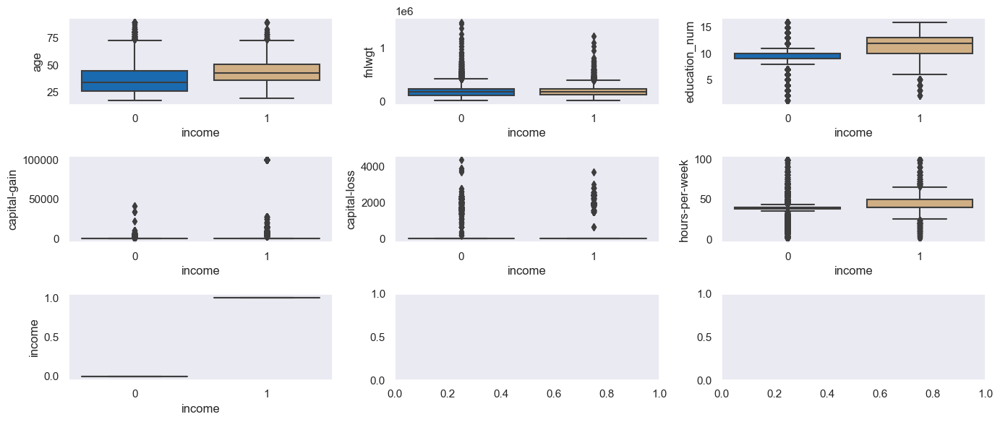

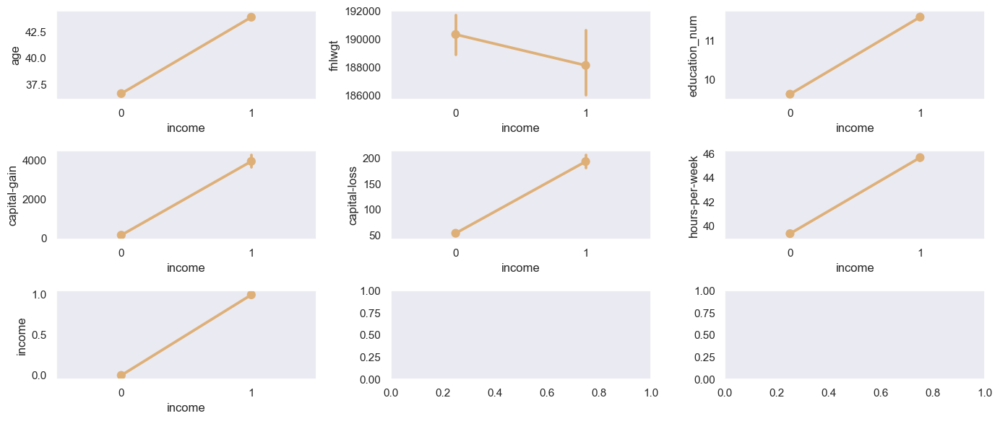

In [79]:
import math
p=df.select_dtypes(include='number').columns.to_list()
p.append("income")
y=3
x=math.ceil((len(p)-1)/y)

plt.subplots(x,y,figsize=(14,6))

for i in range(1,len(p)) :
    plt.subplot(x,y,i)
    sns.boxplot(data=df,y=p[i-1],x='income',palette=['#016CC9','#DEB078'])
    #plt.xlabel(vars[i-1])
    #plt.title(vars[i-1])
plt.tight_layout()    
plt.show()

p=df.select_dtypes(include='number').columns.to_list()
p.append("income")
y=3
x=math.ceil((len(p)-1)/y)

plt.subplots(x,y,figsize=(14,6))

for i in range(1,len(p)) :
    plt.subplot(x,y,i)
    sns.pointplot(data=df,y=p[i-1],x='income',color='#DEB078')
    #plt.xlabel(vars[i-1])
    #plt.title(vars[i-1])
plt.tight_layout()    
plt.show()


In [81]:
def stats(x):
    temp1=(df[[x,'income']].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,'income']
    df6=pd.merge(df.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'), 
                 df.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,'income','Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,'income'])
    return temp3.pivot(columns=x,index='income')
print(stats('workclass'))
print(stats('education'))
print(stats('education_num'))
print(stats('marital-status'))
print(stats('occupation'))
print(stats('relationship'))
print(stats('race'))
print(stats('sex'))
print(stats('native-country'))

          Overall_Percent                                                      \
workclass     Federal-gov  Local-gov  Private  Self-emp-inc  Self-emp-not-inc   
income                                                                          
0                   1.900      4.800   57.700         1.600             5.900   
1                   1.200      2.000   16.200         2.000             2.400   

                                  Category_Percent                      \
workclass  State-gov  Without-pay      Federal-gov  Local-gov  Private   
income                                                                   
0              3.100        0.000           61.290     70.540   78.110   
1              1.100          NaN           38.710     29.460   21.890   

                                                                   
workclass  Self-emp-inc  Self-emp-not-inc  State-gov  Without-pay  
income                                                             
0                44

               Overall_Percent                                 \
native-country        Cambodia  Canada  China  Columbia  Cuba   
income                                                          
0                        0.000   0.200  0.200     0.200 0.200   
1                        0.000   0.100  0.100     0.000 0.100   

                                                                           \
native-country  Dominican-Republic  Ecuador  El-Salvador  England  France   
income                                                                      
0                            0.200    0.100        0.300    0.200   0.000   
1                            0.000    0.000        0.000    0.100   0.000   

                ... Category_Percent                                        \
native-country  ...         Portugal  Puerto-Rico  Scotland  South  Taiwan   
income          ...                                                          
0               ...           88.240       88.990    8

In [82]:
stats('workclass')

Overall_Percent                                                      \
workclass     Federal-gov  Local-gov  Private  Self-emp-inc  Self-emp-not-inc   
income                                                                          
0                   1.900      4.800   57.700         1.600             5.900   
1                   1.200      2.000   16.200         2.000             2.400   

                                  Category_Percent                      \
workclass  State-gov  Without-pay      Federal-gov  Local-gov  Private   
income                                                                   
0              3.100        0.000           61.290     70.540   78.110   
1              1.100          NaN           38.710     29.460   21.890   

                                                                   
workclass  Self-emp-inc  Self-emp-not-inc  State-gov  Without-pay  
income                                                             
0                44.130            71.420     73.100      100.000  
1                55.870            28.580     26.900          NaN

In [83]:
stats('education')

Overall_Percent                                               \
education            10th  11th  12th  1st-4th  5th-6th  7th-8th   9th   
income                                                                   
0                   2.500 3.300 1.200    0.500    0.900    1.700 1.400   
1                   0.200 0.200 0.100    0.000    0.000    0.100 0.100   

                                             ... Category_Percent              \
education  Assoc-acdm  Assoc-voc  Bachelors  ...              9th  Assoc-acdm   
income                                       ...                                
0               2.500      3.200      9.700  ...           94.510      74.600   
1               0.800      1.100      7.100  ...            5.490      25.400   

                                                                         \
education  Assoc-voc  Bachelors  Doctorate  HS-grad  Masters  Preschool   
income                                                                    
0             73.680     57.830     25.330   83.570   43.540    100.000   
1             26.320     42.170     74.670   16.430   56.460        NaN   

                                      
education  Prof-school  Some-college  
income                                
0               25.090        79.980  
1               74.910        20.020  

[2 rows x 32 columns]

In [84]:
stats('education_num')

Overall_Percent                                            \
education_num              1     2     3     4     5     6     7     8    
income                                                                    
0                       0.100 0.500 0.900 1.700 1.400 2.500 3.300 1.200   
1                         NaN 0.000 0.000 0.100 0.100 0.200 0.200 0.100   

                             ... Category_Percent                              \
education_num     9      10  ...               7      8      9      10     11   
income                       ...                                                
0             27.300 17.700  ...           94.370 92.310 83.570 79.980 73.680   
1              5.400  4.400  ...            5.630  7.690 16.430 20.020 26.320   

                                                  
education_num     12     13     14     15     16  
income                                            
0             74.600 57.830 43.540 25.090 25.330  
1             25.400 42.170 56.460 74.910 74.670  

[2 rows x 32 columns]

In [85]:
stats('marital-status')

Overall_Percent                                         \
marital-status        Divorced  Married-AF-spouse  Married-civ-spouse   
income                                                                  
0                       12.500              0.000              25.400   
1                        1.500              0.000              21.200   

                                                                          \
marital-status  Married-spouse-absent  Never-married  Separated  Widowed   
income                                                                     
0                               1.100         30.700      2.900    2.500   
1                               0.100          1.600      0.200    0.300   

               Category_Percent                                         \
marital-status         Divorced  Married-AF-spouse  Married-civ-spouse   
income                                                                   
0                        89.270             52.380              54.500   
1                        10.730             47.620              45.500   

                                                                          
marital-status  Married-spouse-absent  Never-married  Separated  Widowed  
income                                                                    
0                              91.620         95.160     92.970   90.330  
1                               8.380          4.840      7.030    9.670

In [86]:
stats('occupation')

Overall_Percent                                               \
occupation    Adm-clerical  Armed-Forces  Craft-repair  Exec-managerial   
income                                                                    
0                   10.700         0.000        10.300            6.800   
1                    1.700         0.000         3.000            6.400   

                                                                   \
occupation  Farming-fishing  Handlers-cleaners  Machine-op-inspct   
income                                                              
0                     2.900              4.200              5.700   
1                     0.400              0.300              0.800   

                                                            ...  \
occupation  Other-service  Priv-house-serv  Prof-specialty  ...   
income                                                      ...   
0                  10.200            0.500           7.400  ...   
1                   0.400            0.000           6.000  ...   

           Category_Percent                                        \
occupation  Farming-fishing  Handlers-cleaners  Machine-op-inspct   
income                                                              
0                    88.350             93.850             87.580   
1                    11.650              6.150             12.420   

                                                                             \
occupation  Other-service  Priv-house-serv  Prof-specialty  Protective-serv   
income                                                                        
0                  95.890           99.290          55.130           67.390   
1                   4.110            0.710          44.870           32.610   

                                                   
occupation  Sales  Tech-support  Transport-moving  
income                                             
0          72.940        69.480            79.710  
1          27.060        30.520            20.290  

[2 rows x 28 columns]

In [87]:
stats('relationship')

Overall_Percent                                            \
relationship         Husband  Not-in-family  Other-relative  Own-child   
income                                                                   
0                     22.500         22.900           2.800     14.600   
1                     18.800          2.700           0.100      0.200   

                              Category_Percent                                 \
relationship  Unmarried  Wife          Husband  Not-in-family  Other-relative   
income                                                                          
0                 9.900 2.400           54.430         89.330          96.060   
1                 0.700 2.300           45.570         10.670           3.940   

                                           
relationship  Own-child  Unmarried   Wife  
income                                     
0                98.570     93.370 50.640  
1                 1.430      6.630 49.360

In [88]:
stats('race')

Overall_Percent                                           \
race    Amer-Indian-Eskimo  Asian-Pac-Islander  Black  Other  White   
income                                                                
0                    0.800               2.100  8.100  0.700 63.300   
1                    0.100               0.800  1.200  0.100 22.700   

          Category_Percent                                           
race    Amer-Indian-Eskimo  Asian-Pac-Islander  Black  Other  White  
income                                                               
0                   88.110              72.260 87.000 90.910 73.610  
1                   11.890              27.740 13.000  9.090 26.390

In [89]:
stats('sex')

Overall_Percent        Category_Percent       
sex             Female   Male           Female   Male
income                                               
0               28.700 46.400           88.620 68.600
1                3.700 21.200           11.380 31.400

In [90]:
stats('native-country')

Overall_Percent                                 \
native-country        Cambodia  Canada  China  Columbia  Cuba   
income                                                          
0                        0.000   0.200  0.200     0.200 0.200   
1                        0.000   0.100  0.100     0.000 0.100   

                                                                           \
native-country  Dominican-Republic  Ecuador  El-Salvador  England  France   
income                                                                      
0                            0.200    0.100        0.300    0.200   0.000   
1                            0.000    0.000        0.000    0.100   0.000   

                ... Category_Percent                                        \
native-country  ...         Portugal  Puerto-Rico  Scotland  South  Taiwan   
income          ...                                                          
0               ...           88.240       88.990    81.820 80.280  54.760   
1               ...           11.760       11.010    18.180 19.720  45.240   

                                                                               
native-country  Thailand  Trinadad&Tobago  United-States  Vietnam  Yugoslavia  
income                                                                         
0                 82.350           88.890         74.560   92.190      62.500  
1                 17.650           11.110         25.440    7.810      37.500  

[2 rows x 82 columns]

In [77]:


df=df.dropna()
df_test=df_test.dropna()

fig=px.histogram(df, x='workclass', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('workclass')
fig.show()
fig=px.histogram(df, x='education', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('education')
fig.show()
fig=px.histogram(df, x='education_num', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('education_num')
fig.show()
fig=px.histogram(df, x='marital-status', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('marital-status')
fig.show()
fig=px.histogram(df, x='occupation', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('occupation')
fig.show()
fig=px.histogram(df, x='relationship', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('relationship')
fig.show()
fig=px.histogram(df, x='race', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('race')
fig.show()
fig=px.histogram(df, x='sex', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('sex')
fig.show()
fig=px.histogram(df, x='native-country', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])
stats('native-country')
fig.show()


kk=(df.select_dtypes(include='number').columns).to_list()

df2=df[kk]


upper =df2.quantile(0.75)+1.5 *(df2.quantile(0.75)-df2.quantile(0.25))
lower = df2.quantile(0.25)-1.5 *(df2.quantile(0.75)-df2.quantile(0.25))

for i in kk:
    print('\nColumn -> ',i,'')   
    x= df2[ (df2[i]<round(lower[i],2)) |  (df2[i]>round(upper[i],2))][i].to_list()
    print('No of Outliers presesnt -> ',len(x))
    print('\n','*'*10)


Column ->  age 
No of Outliers presesnt ->  168

 **********

Column ->  fnlwgt 
No of Outliers presesnt ->  904

 **********

Column ->  education_num 
No of Outliers presesnt ->  193

 **********

Column ->  capital-gain 
No of Outliers presesnt ->  2538

 **********

Column ->  capital-loss 
No of Outliers presesnt ->  1427

 **********

Column ->  hours-per-week 
No of Outliers presesnt ->  7947

 **********

Column ->  income 
No of Outliers presesnt ->  7506

 **********


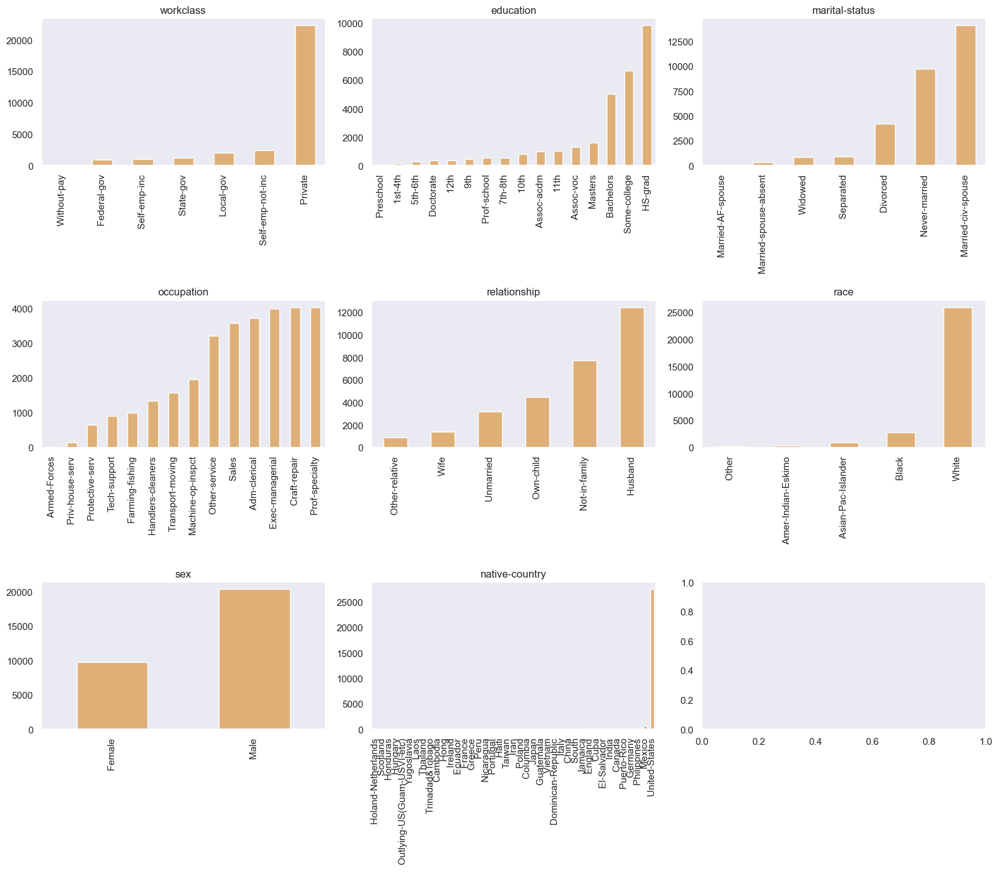

In [80]:
fields=df.select_dtypes(exclude="number").columns

figuresize=(16,14)
cols=3
rows=math.ceil(len(fields)/cols)
#print()

plt.subplots(rows,cols,figsize=figuresize)
for i in range(1,len(fields)+1) :
    plt.subplot(rows,cols,i)
    df[fields[i-1]].value_counts().sort_values().plot.bar(color='#DEB078')  
    plt.xticks(rotation=90)
    plt.title(fields[i-1])
    
plt.tight_layout()
plt.show()

In [92]:
df=df.applymap(lambda x: np.nan if x==' ?' else x)
print(df.head().to_string())
df_test=df_test.applymap(lambda x: np.nan if x==' ?' else x)
print(df_test.head().to_string)

   age          workclass  fnlwgt   education  education_num       marital-status          occupation    relationship    race      sex  capital-gain  capital-loss  hours-per-week  native-country  income
0   39          State-gov   77516   Bachelors             13        Never-married        Adm-clerical   Not-in-family   White     Male          2174             0              40   United-States       0
1   50   Self-emp-not-inc   83311   Bachelors             13   Married-civ-spouse     Exec-managerial         Husband   White     Male             0             0              13   United-States       0
2   38            Private  215646     HS-grad              9             Divorced   Handlers-cleaners   Not-in-family   White     Male             0             0              40   United-States       0
3   53            Private  234721        11th              7   Married-civ-spouse   Handlers-cleaners         Husband   Black     Male             0             0              40   United-

In [5]:
print(df.isna().sum().sum())

4261


In [6]:
print(df.columns)

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')


In [93]:
target_Variable     = 'income'
input_features      = [col for col in df.columns if col not in ['kfold',target_Variable]]
numerical_columns   = ['age', 'fnlwgt','capital-gain', 'capital-loss','hours-per-week']
categorical_columns = [col for col in input_features if not col in numerical_columns]
print(input_features)
print(categorical_columns)

['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']
['workclass', 'education', 'education_num', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country']


In [94]:
df[['education_num']]=df[['education_num']].astype('str')
print(df[['income']].value_counts(normalize=True).round(decimals=3)*100)
print(df.select_dtypes(exclude='number').columns[:-1])

income
0        75.100
1        24.900
dtype: float64
Index(['workclass', 'education', 'education_num', 'marital-status',
       'occupation', 'relationship', 'race', 'sex'],
      dtype='object')


In [19]:
def check_null_values(df):
    for i in df.columns:
        t = df[i].value_counts()
        index = list(t.index)
        print ("The Value Counts of ? in", i)
        for i in index:
            temp = 0
            if i == ' ?':
                print (t[' ?'])
                temp = 1
                break
        if temp == 0:
            print ("0")
df=df.applymap(lambda x: np.nan if x==' ?' else x)
df_test=df_test.applymap(lambda x: np.nan if x==' ?' else x)
check_null_values(df)
check_null_values(df_test)


The Value Counts of ? in age
0
The Value Counts of ? in workclass
0
The Value Counts of ? in fnlwgt
0
The Value Counts of ? in education
0
The Value Counts of ? in education_num
0
The Value Counts of ? in marital-status
0
The Value Counts of ? in occupation
0
The Value Counts of ? in relationship
0
The Value Counts of ? in race
0
The Value Counts of ? in sex
0
The Value Counts of ? in capital-gain
0
The Value Counts of ? in capital-loss
0
The Value Counts of ? in hours-per-week
0
The Value Counts of ? in native-country
0
The Value Counts of ? in income
0
The Value Counts of ? in age
0
The Value Counts of ? in workclass
0
The Value Counts of ? in fnlwgt
0
The Value Counts of ? in education
0
The Value Counts of ? in education_num
0
The Value Counts of ? in marital-status
0
The Value Counts of ? in occupation
0
The Value Counts of ? in relationship
0
The Value Counts of ? in race
0
The Value Counts of ? in sex
0
The Value Counts of ? in capital-gain
0
The Value Counts of ? in capital-los

In [103]:
df=df.dropna()
df_test=df_test.dropna()
print(df.isna().sum().sum())

0


In [97]:
#Removing the features that have boxplot 0
df.drop(['capital-gain', 'capital-loss', 'native-country'], axis = 1, inplace = True)
df_test.drop(['capital-gain', 'capital-loss', 'native-country'], axis = 1, inplace = True)

In [8]:
print(df.columns)

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'hours-per-week', 'income'],
      dtype='object')


In [110]:
target_variable     = 'income'
input_features      = [col for col in df.columns if not col in ['education',target_variable]]
numerical_columns   = ['age', 'fnlwgt','education_num','hours-per-week']
categorical_columns = [col for col in input_features if not col in numerical_columns]
print(input_features)
print(categorical_columns)
print(df['education_num'].head())

['age', 'fnlwgt', 'education_num', 'hours-per-week', 'workclass_ Local-gov', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'marital-status_ Married-AF-spouse', 'marital-status_ Married-civ-spouse', 'marital-status_ Married-spouse-absent', 'marital-status_ Never-married', 'marital-status_ Separated', 'marital-status_ Widowed', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race

In [99]:
df = pd.get_dummies(df, columns = categorical_columns, drop_first=True)
df_test = pd.get_dummies(df_test, columns = categorical_columns, drop_first=True)

In [104]:
def Standardize(df, num_col):
    for i in num_col:
        print(i)
        df[i] = (df[i] - df[i].mean())/df[i].std()
    return df

In [111]:
df[['education_num']]=df[['education_num']].astype('int8')
df.drop('education', axis = 1, inplace = True)
df_test.drop('education', axis = 1, inplace = True)

KeyError: "['education'] not found in axis"

In [124]:
df=Standardize(df, numerical_columns)
df_test=Standardize(df_test, numerical_columns)

age
fnlwgt
education_num
hours-per-week
age
fnlwgt
education_num
hours-per-week


In [47]:
print(df['hours-per-week'])

0       -0.078
1       -2.332
2       -0.078
3       -0.078
4       -0.078
         ...  
32556   -0.245
32557   -0.078
32558   -0.078
32559   -1.748
32560   -0.078
Name: hours-per-week, Length: 30139, dtype: float64


In [125]:
X_train=df.drop('income',axis=1)
y_train=df['income']

In [126]:
print(X_train.columns)
print(y_train.head(10))

Index(['age', 'fnlwgt', 'education_num', 'hours-per-week',
       'workclass_ Local-gov', 'workclass_ Private', 'workclass_ Self-emp-inc',
       'workclass_ Self-emp-not-inc', 'workclass_ State-gov',
       'workclass_ Without-pay', 'marital-status_ Married-AF-spouse',
       'marital-status_ Married-civ-spouse',
       'marital-status_ Married-spouse-absent',
       'marital-status_ Never-married', 'marital-status_ Separated',
       'marital-status_ Widowed', 'occupation_ Armed-Forces',
       'occupation_ Craft-repair', 'occupation_ Exec-managerial',
       'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners',
       'occupation_ Machine-op-inspct', 'occupation_ Other-service',
       'occupation_ Priv-house-serv', 'occupation_ Prof-specialty',
       'occupation_ Protective-serv', 'occupation_ Sales',
       'occupation_ Tech-support', 'occupation_ Transport-moving',
       'relationship_ Not-in-family', 'relationship_ Other-relative',
       'relationship_ Own-child', '

In [127]:
from prettytable import PrettyTable
pt=PrettyTable()
pt.field_names=['Model', 'Accuracy Score', 'Precision Score', 'Recall Score', 'F1 Score']

#Train the model using model and data and show the confusion matrix and classification report in the form of visualization inside a function and cross val score of precision, recall and f1 score using for loop inside a function to loop over models
def run_model_and_metrics(model, X_train, X_test, y_train, y_test, name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f'{name} model results are: ')

    print('Accuracy score of the model is: ', model.score(X_test, y_test))

    print('Confusion matrix of the model is: ')
    sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred)), annot = True, cmap = 'coolwarm')
    plt.show()

    print('Classification report of the model is: ')
    sns.heatmap(pd.DataFrame(classification_report(y_test, y_pred, output_dict = True)), annot = True, cmap = 'coolwarm')
    plt.show()

    print('Cross validation score of the model is based on Accuracy is: ')
    print(cross_val_score(model, X_train, y_train, cv = 5, scoring = 'accuracy'))

    print('Precision Score: ', precision_score(y_test, y_pred))
    print('Cross validation score of the model is based on Precision is: ')
    print(cross_val_score(model, X_train, y_train, cv = 5, scoring = 'precision'))

    print('Recall Score: ', recall_score(y_test, y_pred))
    print('Cross validation score of the model is based on Recall is: ')
    print(cross_val_score(model, X_train, y_train, cv = 5, scoring = 'recall'))

    print('F1 Score: ', f1_score(y_test, y_pred))
    print('Cross validation score of the model is based on F1 score is: ')
    print(cross_val_score(model, X_train, y_train, cv = 5, scoring = 'f1'))

    pt.add_row([name, model.score(X_test, y_test), precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)])

    print(pt)

Gaussian Naive Bayes model results are: 
Accuracy score of the model is:  0.6284860557768924
Confusion matrix of the model is: 


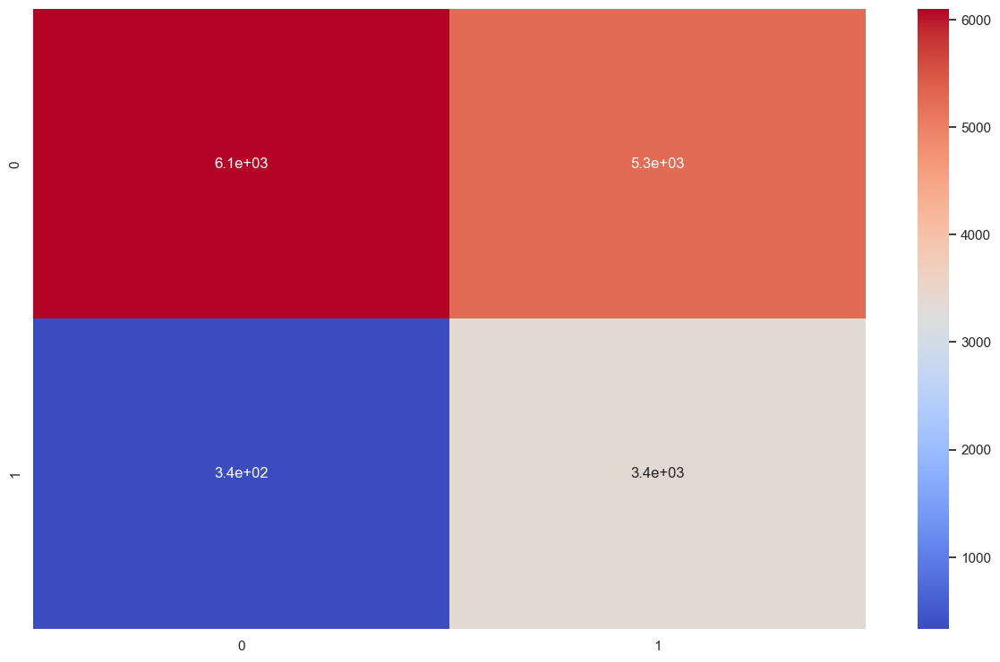

Classification report of the model is: 


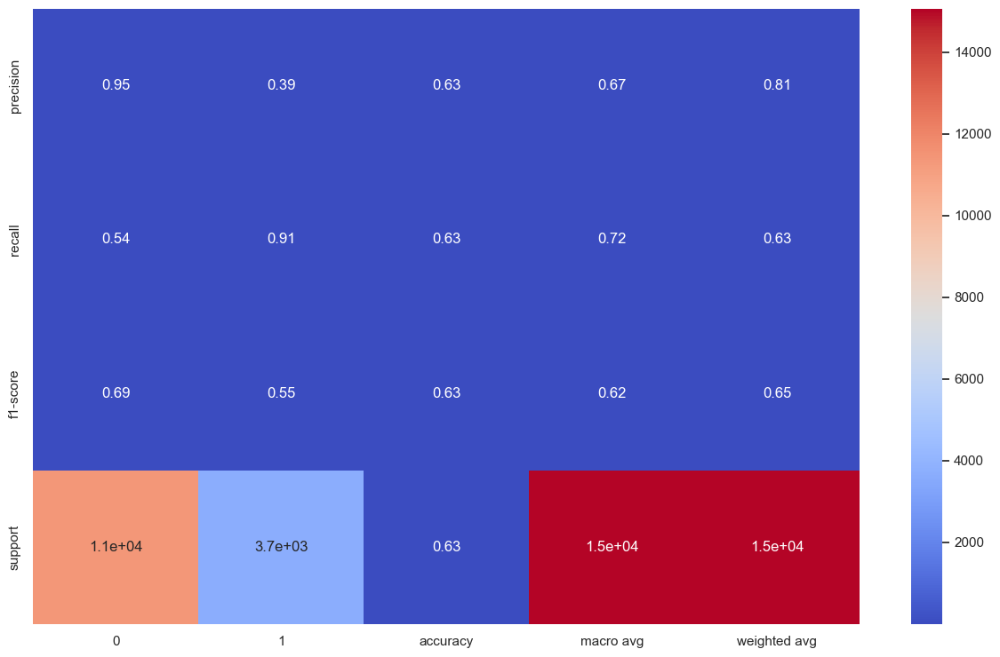

Cross validation score of the model is based on Accuracy is: 
[0.63321168 0.62972794 0.63238222 0.5950564  0.58038825]
Precision Score:  0.39014492753623187
Cross validation score of the model is based on Precision is: 
[0.39757646 0.39463822 0.39724059 0.37496671 0.36544503]
Recall Score:  0.9094594594594595
Cross validation score of the model is based on Recall is: 
[0.91805463 0.91205863 0.92071952 0.93741678 0.93004664]
F1 Score:  0.5460446247464502
Cross validation score of the model is based on F1 score is: 
[0.55486209 0.55090543 0.55502008 0.53566673 0.5247134 ]
+----------------------+--------------------+---------------------+--------------------+--------------------+
|        Model         |   Accuracy Score   |   Precision Score   |    Recall Score    |      F1 Score      |
+----------------------+--------------------+---------------------+--------------------+--------------------+
| Gaussian Naive Bayes | 0.6284860557768924 | 0.39014492753623187 | 0.9094594594594595 | 0.54

In [128]:
from sklearn.model_selection import cross_val_score, train_test_split as tts
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
gnb = GaussianNB()
run_model_and_metrics(gnb, X_train, df_test.drop('income',axis=1), y_train, df_test['income'], 'Gaussian Naive Bayes')

C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic Regression model results are: 
Accuracy score of the model is:  0.8292164674634794
Confusion matrix of the model is: 


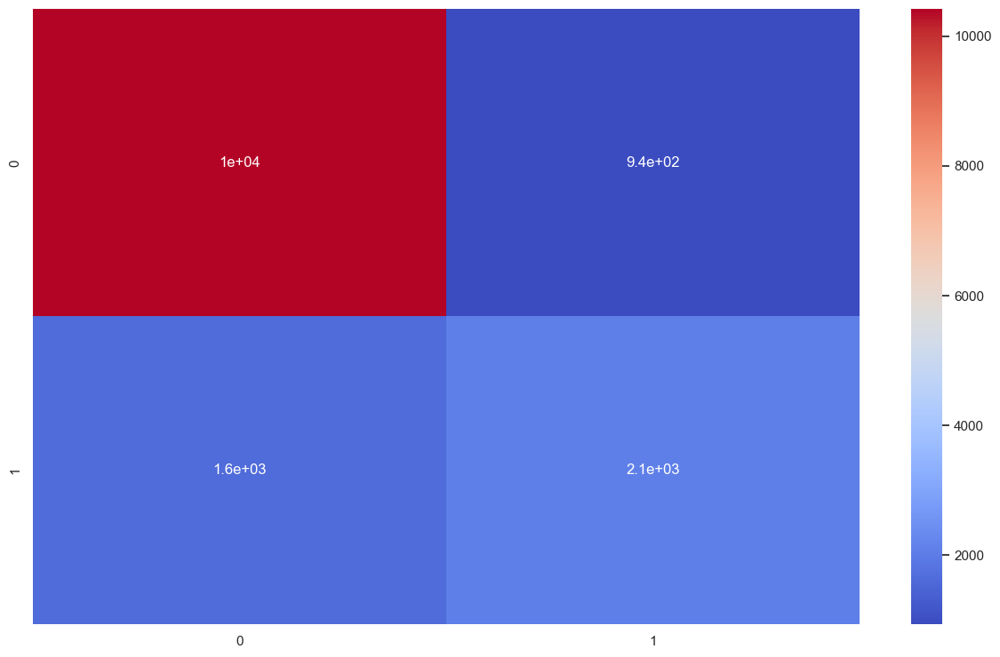

Classification report of the model is: 


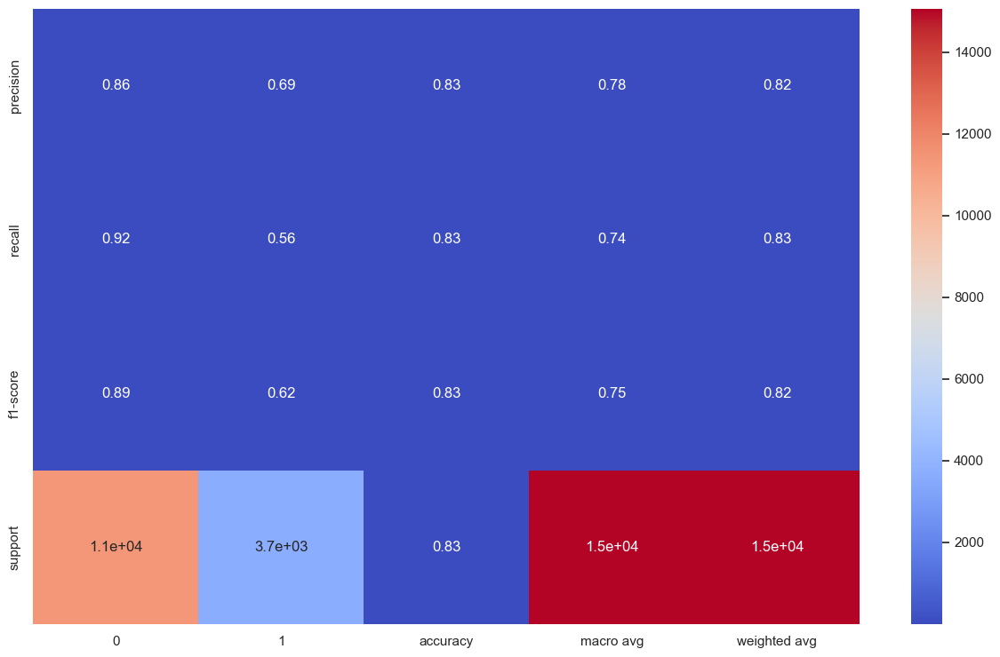

Cross validation score of the model is based on Accuracy is: 


C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\

[0.8296284  0.82415395 0.82979429 0.84140677 0.83009789]
Precision Score:  0.6875
Cross validation score of the model is based on Precision is: 


C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\

[0.69522241 0.67854251 0.69579555 0.7301855  0.69311741]
Recall Score:  0.5589189189189189
Cross validation score of the model is based on Recall is: 


C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\

[0.56229181 0.55829447 0.56229181 0.57656458 0.57028648]
F1 Score:  0.616577221228384
Cross validation score of the model is based on F1 score is: 


C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\SrikarUmmineni\

[0.62173112 0.6125731  0.62196021 0.64434524 0.62573099]
+----------------------+--------------------+---------------------+--------------------+--------------------+
|        Model         |   Accuracy Score   |   Precision Score   |    Recall Score    |      F1 Score      |
+----------------------+--------------------+---------------------+--------------------+--------------------+
| Gaussian Naive Bayes | 0.6284860557768924 | 0.39014492753623187 | 0.9094594594594595 | 0.5460446247464502 |
| Logistic Regression  | 0.8292164674634794 |        0.6875       | 0.5589189189189189 | 0.616577221228384  |
+----------------------+--------------------+---------------------+--------------------+--------------------+


C:\Users\SrikarUmmineni\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [129]:
lr = LogisticRegression()
run_model_and_metrics(lr, X_train, df_test.drop('income',axis=1), y_train, df_test['income'], 'Logistic Regression')

Decision Tree Classifier model results are: 
Accuracy score of the model is:  0.7704515272244356
Confusion matrix of the model is: 


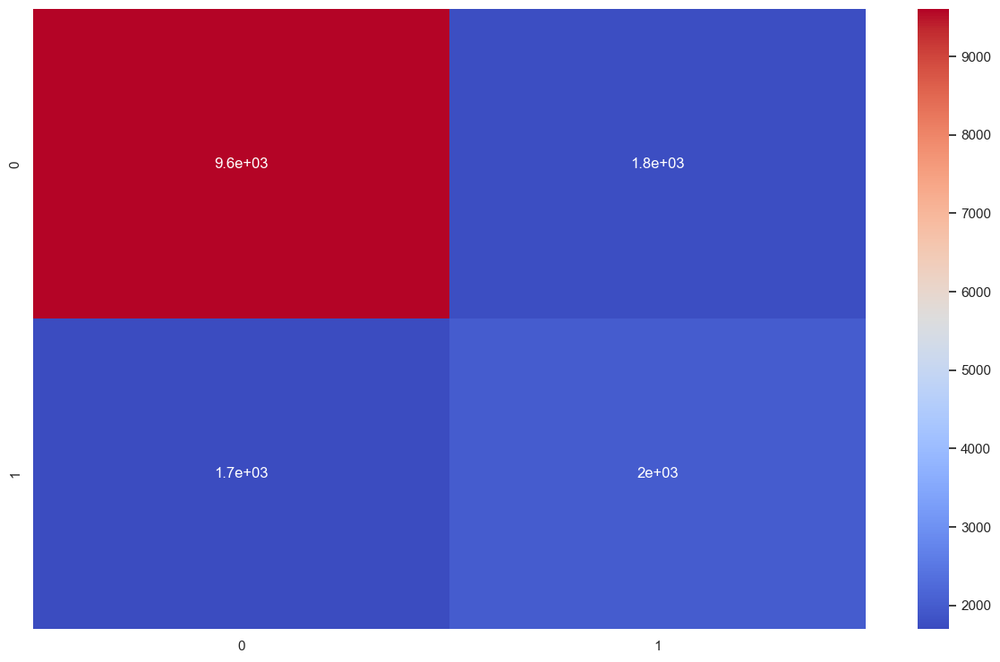

Classification report of the model is: 


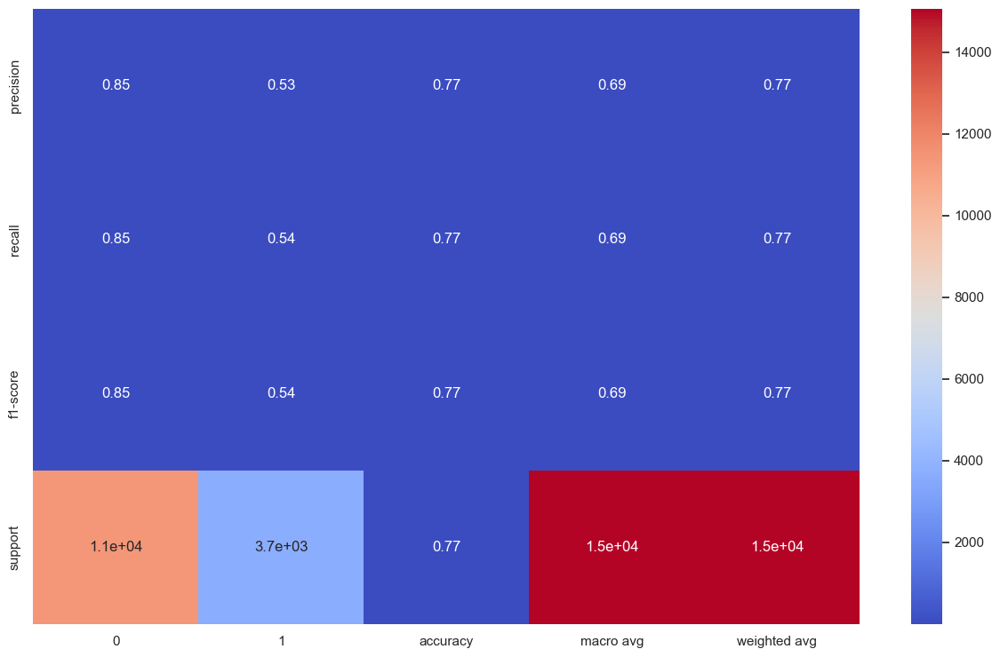

Cross validation score of the model is based on Accuracy is: 
[0.77090246 0.76692104 0.77737226 0.77256138 0.76522316]
Precision Score:  0.5323741007194245
Cross validation score of the model is based on Precision is: 
[0.53927393 0.53727506 0.54934211 0.55349794 0.53067885]
Recall Score:  0.54
Cross validation score of the model is based on Recall is: 
[0.54297135 0.56029314 0.55429714 0.53928096 0.54963358]
F1 Score:  0.5361599355964042
Cross validation score of the model is based on F1 score is: 
[0.52732693 0.55089431 0.54527297 0.5472973  0.5417622 ]
+--------------------------+--------------------+---------------------+--------------------+--------------------+
|          Model           |   Accuracy Score   |   Precision Score   |    Recall Score    |      F1 Score      |
+--------------------------+--------------------+---------------------+--------------------+--------------------+
|   Gaussian Naive Bayes   | 0.6284860557768924 | 0.39014492753623187 | 0.9094594594594595 | 0.5

In [130]:
dt = DecisionTreeClassifier()
run_model_and_metrics(dt, X_train, df_test.drop('income',axis=1), y_train, df_test['income'], 'Decision Tree Classifier')

In [61]:
print(X_train.columns)

Index(['age', 'fnlwgt', 'education_num', 'hours-per-week',
       'workclass_ Local-gov', 'workclass_ Private', 'workclass_ Self-emp-inc',
       'workclass_ Self-emp-not-inc', 'workclass_ State-gov',
       'workclass_ Without-pay', 'marital-status_ Married-AF-spouse',
       'marital-status_ Married-civ-spouse',
       'marital-status_ Married-spouse-absent',
       'marital-status_ Never-married', 'marital-status_ Separated',
       'marital-status_ Widowed', 'occupation_ Armed-Forces',
       'occupation_ Craft-repair', 'occupation_ Exec-managerial',
       'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners',
       'occupation_ Machine-op-inspct', 'occupation_ Other-service',
       'occupation_ Priv-house-serv', 'occupation_ Prof-specialty',
       'occupation_ Protective-serv', 'occupation_ Sales',
       'occupation_ Tech-support', 'occupation_ Transport-moving',
       'relationship_ Not-in-family', 'relationship_ Other-relative',
       'relationship_ Own-child', '